README.md:   0%|          | 0.00/3.56k [00:00<?, ?B/s]

(…)-00000-of-00001-2c9335408bd5503d.parquet:   0%|          | 0.00/305M [00:00<?, ?B/s]

(…)-00000-of-00001-51a32a9b21a2097c.parquet:   0%|          | 0.00/44.1M [00:00<?, ?B/s]

(…)-00000-of-00001-7670918d21b7b1b6.parquet:   0%|          | 0.00/88.7M [00:00<?, ?B/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating validation split: 0 examples [00:00, ? examples/s]

Generating test split: 0 examples [00:00, ? examples/s]

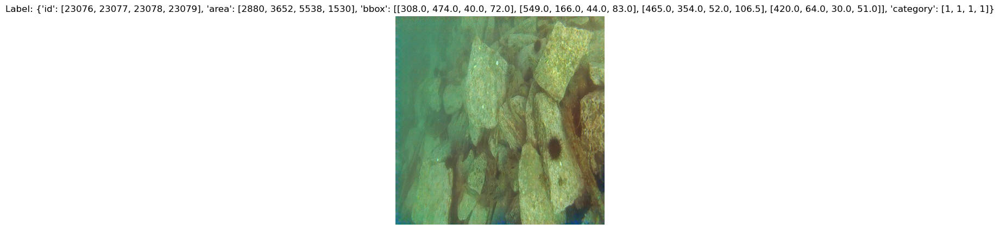

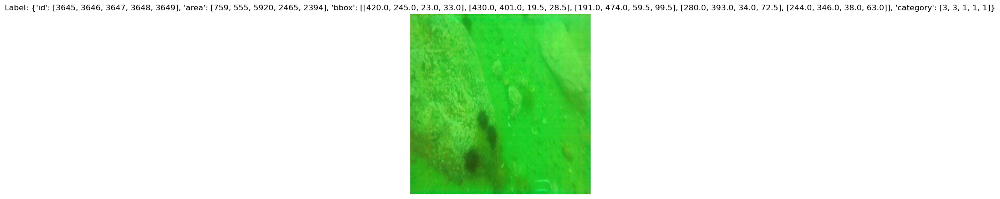

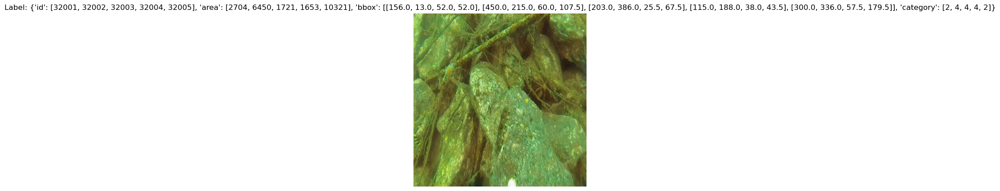

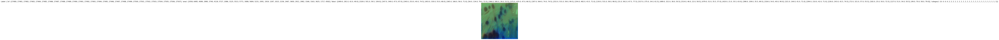

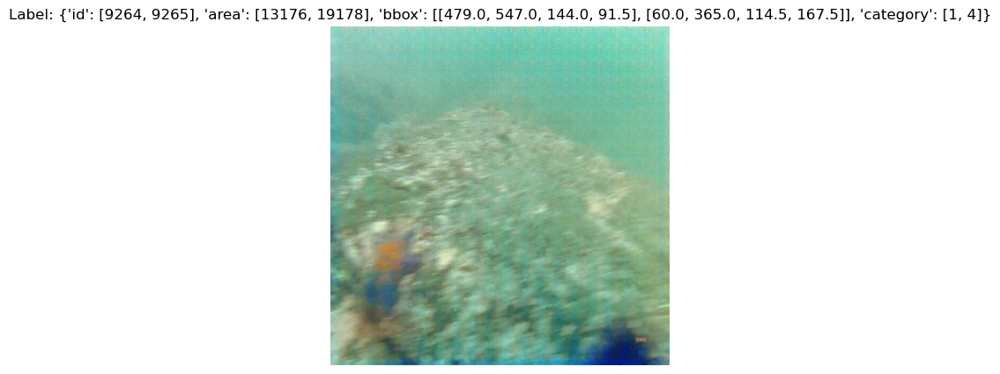

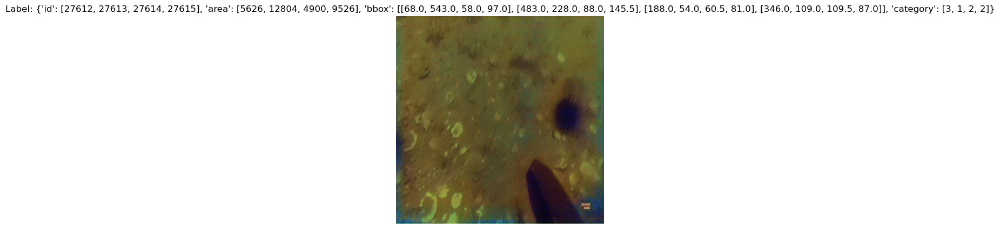

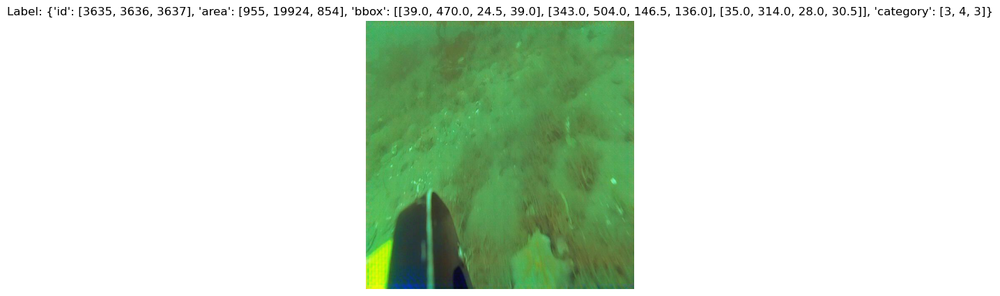

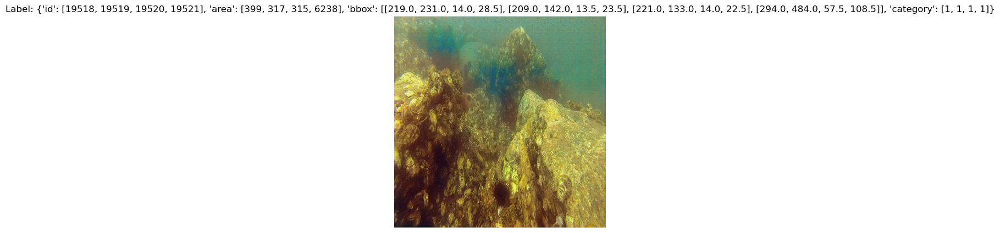

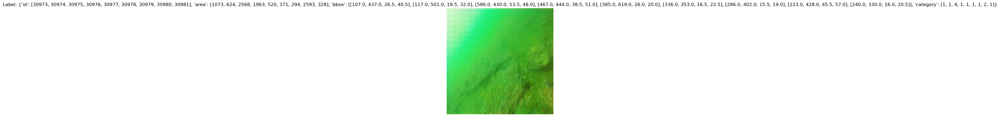

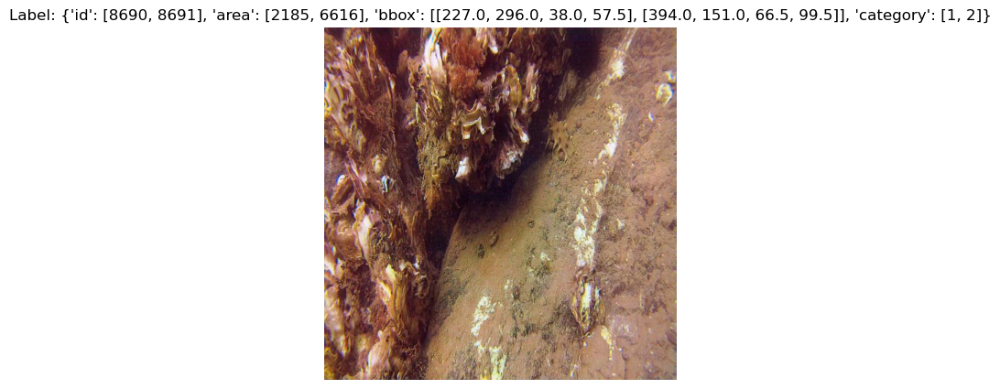

In [14]:
import matplotlib.pyplot as plt
from datasets import load_dataset

# Load the dataset
ds = load_dataset("Francesco/underwater-objects-5v7p8")

# Select the dataset split (default to "train" or first available)
split_name = "train" if "train" in ds else list(ds.keys())[0]

# Extract 10 samples
samples = ds[split_name].select(range(10))

# Plot images separately
for i, (image, obj) in enumerate(zip(samples["image"], samples["objects"])):  
    label = obj if obj else "No Label"  # Extract labels (or show "No Label" if empty)
    
    plt.figure(figsize=(5, 5))
    plt.imshow(image)
    plt.title(f"Label: {label}", fontsize=12)
    plt.axis("off")
    plt.show()

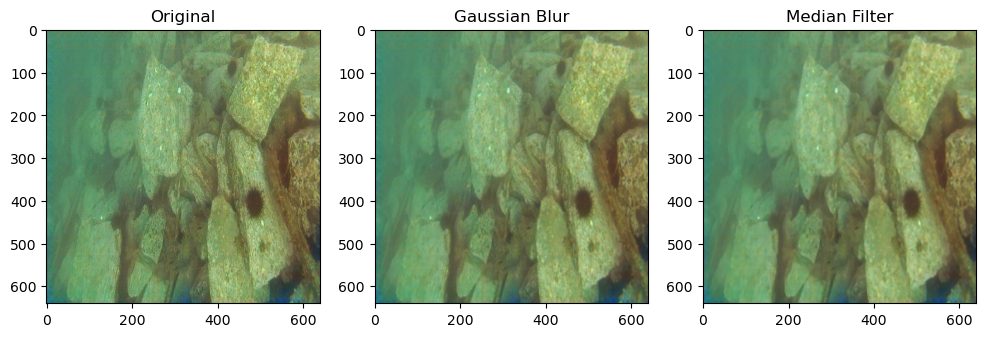

C:\Users\niran\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] The system cannot find the file specified
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "C:\Users\niran\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "C:\Users\niran\anaconda3\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\niran\anaconda3\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "C:\Users\niran\anaconda3\Lib\subprocess.py", line 1538, in _execute_child
    hp, ht, pid, tid = _winapi.CreatePro

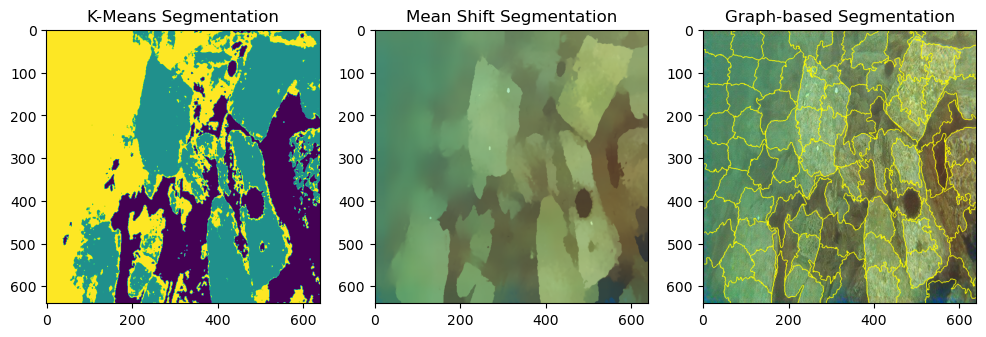

C:\Users\niran\AppData\Local\Temp\ipykernel_24208\3900093716.py:58: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  refined = remove_small_objects(labeled_array, min_size=500)


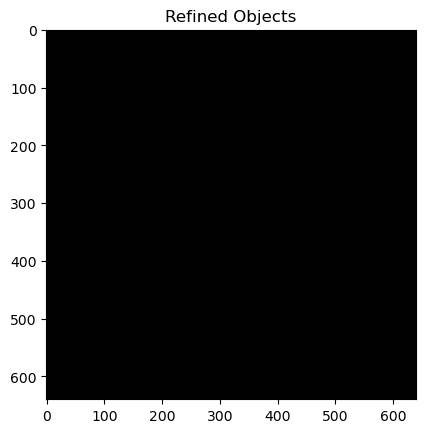

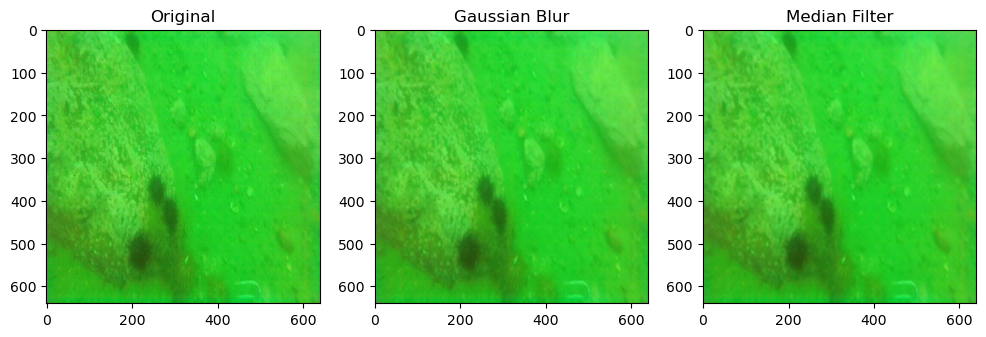

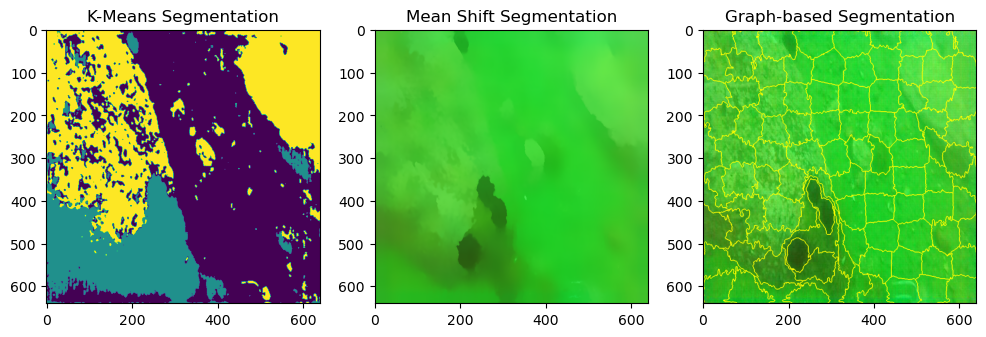

C:\Users\niran\AppData\Local\Temp\ipykernel_24208\3900093716.py:58: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  refined = remove_small_objects(labeled_array, min_size=500)


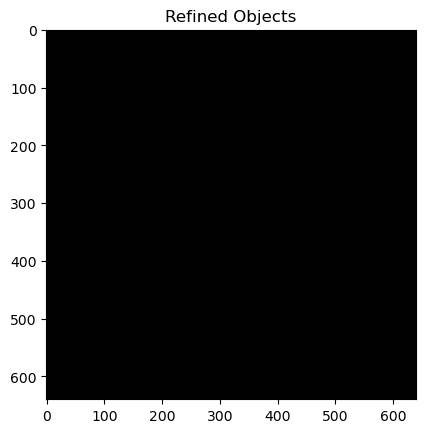

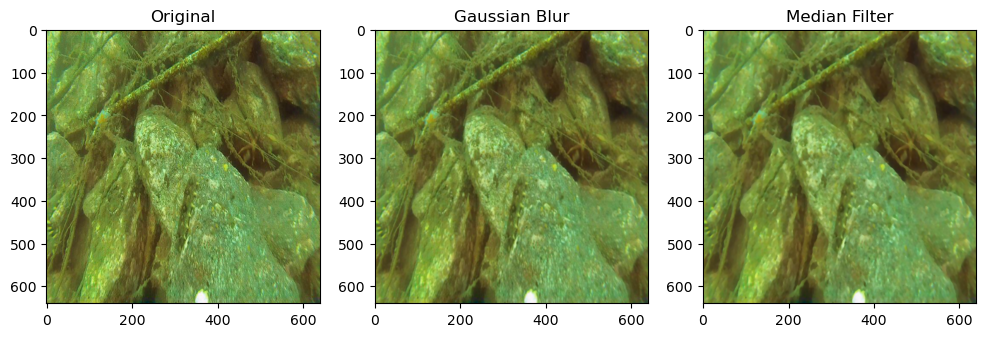

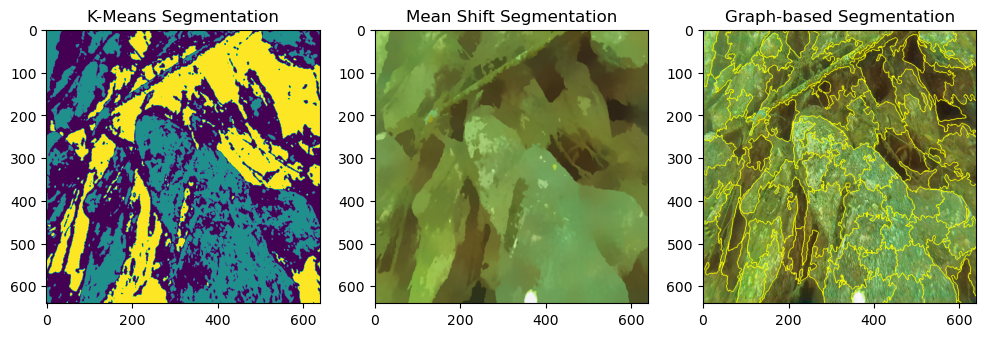

C:\Users\niran\AppData\Local\Temp\ipykernel_24208\3900093716.py:58: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  refined = remove_small_objects(labeled_array, min_size=500)


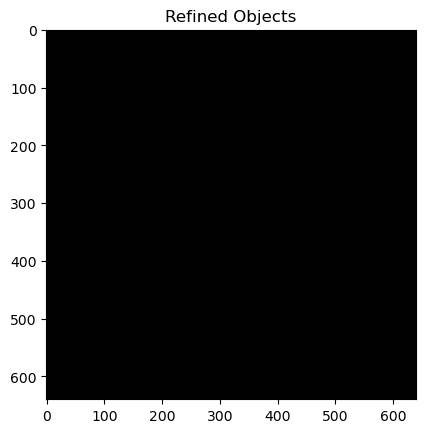

In [2]:
from datasets import load_dataset
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from skimage.segmentation import slic, mark_boundaries
from skimage.morphology import remove_small_objects
from scipy.ndimage import label

def load_data():
    dataset = load_dataset("Francesco/underwater-objects-5v7p8")
    return dataset['train']

def apply_filters(image):
    # Linear filter: Gaussian Blur
    gaussian_filtered = cv2.GaussianBlur(image, (5, 5), 1)

    # Non-linear filter: Median Filter
    median_filtered = cv2.medianBlur(image, 5)

    return gaussian_filtered, median_filtered

def visualize_filters(original, filtered1, filtered2):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(original)
    plt.title("Original")

    plt.subplot(1, 3, 2)
    plt.imshow(filtered1)
    plt.title("Gaussian Blur")

    plt.subplot(1, 3, 3)
    plt.imshow(filtered2)
    plt.title("Median Filter")

    plt.show()

def kmeans_segmentation(image, k=3):
    pixels = image.reshape((-1, 3))
    kmeans = KMeans(n_clusters=k, random_state=42).fit(pixels)
    segmented_image = kmeans.labels_.reshape(image.shape[:2])
    return segmented_image

def mean_shift_segmentation(image):
    spatial_radius = 20
    color_radius = 30
    mean_shift = cv2.pyrMeanShiftFiltering(image, spatial_radius, color_radius)
    return mean_shift

def graph_based_segmentation(image, n_segments=100):
    segments = slic(image, n_segments=n_segments, compactness=10)
    return segments

def refine_objects(segmented_image):
    labeled_array, num_features = label(segmented_image)
    refined = remove_small_objects(labeled_array, min_size=500)
    return refined

def process_images():
    dataset = load_data()
    for item in dataset.select(range(3)):
        image = np.array(item['image'])

        # Apply filters
        gaussian_filtered, median_filtered = apply_filters(image)
        visualize_filters(image, gaussian_filtered, median_filtered)

        # Apply segmentation
        kmeans_result = kmeans_segmentation(median_filtered)
        mean_shift_result = mean_shift_segmentation(median_filtered)
        graph_result = graph_based_segmentation(median_filtered)

        plt.figure(figsize=(12, 4))

        plt.subplot(1, 3, 1)
        plt.imshow(kmeans_result, cmap='viridis')
        plt.title("K-Means Segmentation")

        plt.subplot(1, 3, 2)
        plt.imshow(mean_shift_result)
        plt.title("Mean Shift Segmentation")

        plt.subplot(1, 3, 3)
        plt.imshow(mark_boundaries(image, graph_result))
        plt.title("Graph-based Segmentation")

        plt.show()

        # Refine and extract objects
        refined = refine_objects(graph_result)
        plt.imshow(refined, cmap='gray')
        plt.title("Refined Objects")
        plt.show()

if __name__ == "__main__":
    process_images()

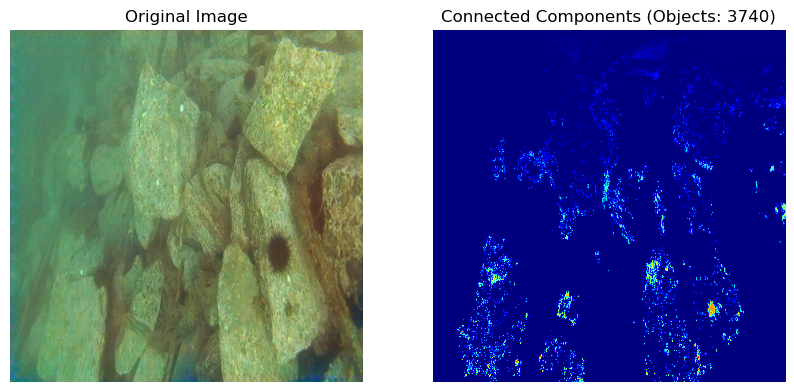

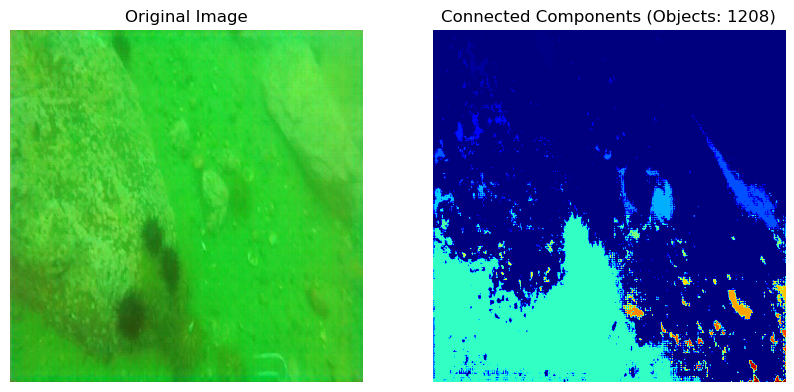

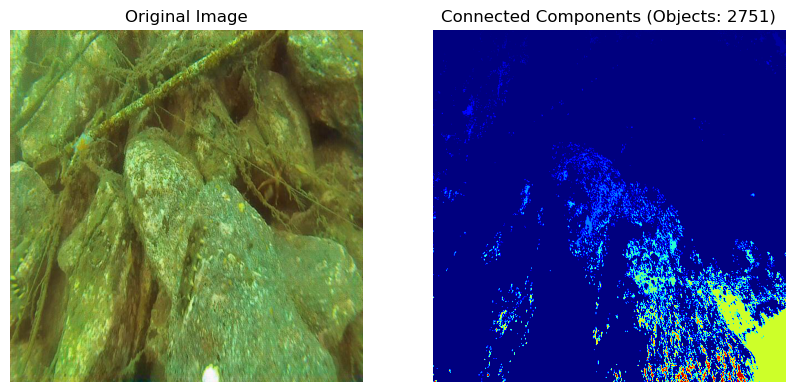

In [23]:
def connected_component_analysis(image):
    img = np.array(image)
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Apply threshold
    _, binary = cv2.threshold(img_gray, 128, 255, cv2.THRESH_BINARY_INV)

    # Connected Component Analysis
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(binary, connectivity=8)

    return labels, num_labels

# Apply on first image
img = samples["image"][0]
labels, num_labels = connected_component_analysis(img)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(labels, cmap="jet")
plt.title(f"Connected Components (Objects: {num_labels})")
plt.axis("off")

plt.show()

# Apply on first image
img = samples["image"][1]
labels, num_labels = connected_component_analysis(img)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(labels, cmap="jet")
plt.title(f"Connected Components (Objects: {num_labels})")
plt.axis("off")

plt.show()

# Apply on first image
img = samples["image"][2]
labels, num_labels = connected_component_analysis(img)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(labels, cmap="jet")
plt.title(f"Connected Components (Objects: {num_labels})")
plt.axis("off")

plt.show()

Detected Regions: 3892


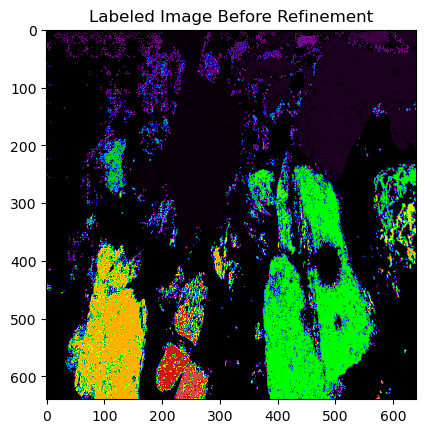

IoU: 0.9275, Dice: 0.9624, Pixel Accuracy: 0.9709


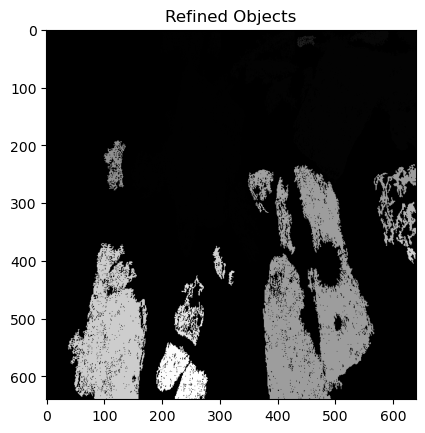

Detected Regions: 505


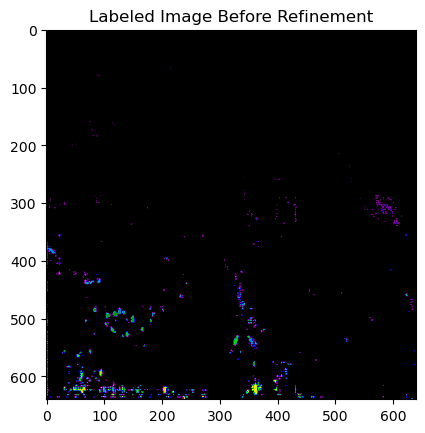

IoU: 0.9923, Dice: 0.9961, Pixel Accuracy: 0.9942


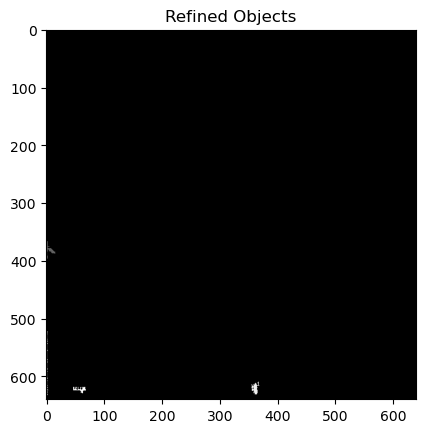

Detected Regions: 3208


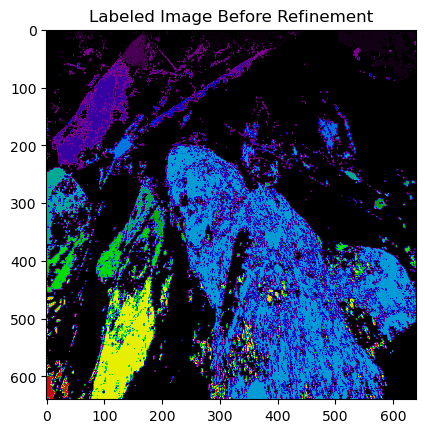

IoU: 0.8881, Dice: 0.9407, Pixel Accuracy: 0.9626


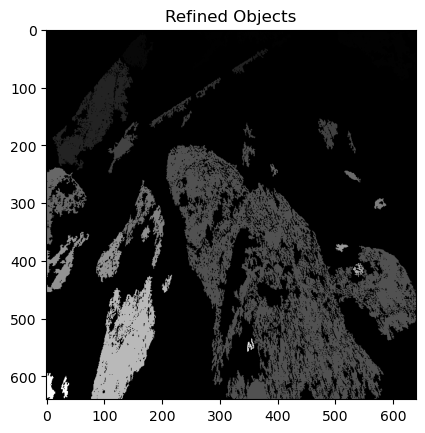

In [3]:
from datasets import load_dataset
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import remove_small_objects
from scipy.ndimage import label
from sklearn.metrics import jaccard_score, accuracy_score, f1_score

def load_data():
    dataset = load_dataset("Francesco/underwater-objects-5v7p8")
    return dataset['train']

def evaluate_segmentation(true_mask, predicted_mask):
    true_mask_flat = (true_mask.flatten() > 0).astype(int)
    predicted_mask_flat = (predicted_mask.flatten() > 0).astype(int)

    iou = jaccard_score(true_mask_flat, predicted_mask_flat, average='binary')
    dice = f1_score(true_mask_flat, predicted_mask_flat, average='binary')
    pixel_acc = accuracy_score(true_mask_flat, predicted_mask_flat)

    print(f"IoU: {iou:.4f}, Dice: {dice:.4f}, Pixel Accuracy: {pixel_acc:.4f}")

    return iou, dice, pixel_acc

def refine_objects_debug(segmented_image, true_mask, min_size=100):
    # Label connected components
    labeled_array, num_features = label(segmented_image)
    print(f"Detected Regions: {num_features}")

    # Visualize labeled regions before refinement
    plt.imshow(labeled_array, cmap='nipy_spectral')
    plt.title("Labeled Image Before Refinement")
    plt.show()

    # Apply small object removal
    refined = remove_small_objects(labeled_array, min_size=min_size)

    # Evaluate segmentation
    iou, dice, pixel_acc = evaluate_segmentation(true_mask, refined)

    # Visualize refined objects
    plt.imshow(refined, cmap='gray')
    plt.title("Refined Objects")
    plt.show()

    return refined, iou, dice, pixel_acc

def process_images():
    dataset = load_data()
    for item in dataset.select(range(3)):
        image = np.array(item['image'])

        # Dummy segmentation (convert to grayscale for demonstration)
        gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        _, segmented_image = cv2.threshold(gray_image, 128, 255, cv2.THRESH_BINARY)

        # Placeholder for ground truth mask (replace with real mask if available)
        true_mask = segmented_image.copy()

        # Apply refinement debug
        refine_objects_debug(segmented_image, true_mask, min_size=100)

if __name__ == "__main__":
    process_images()

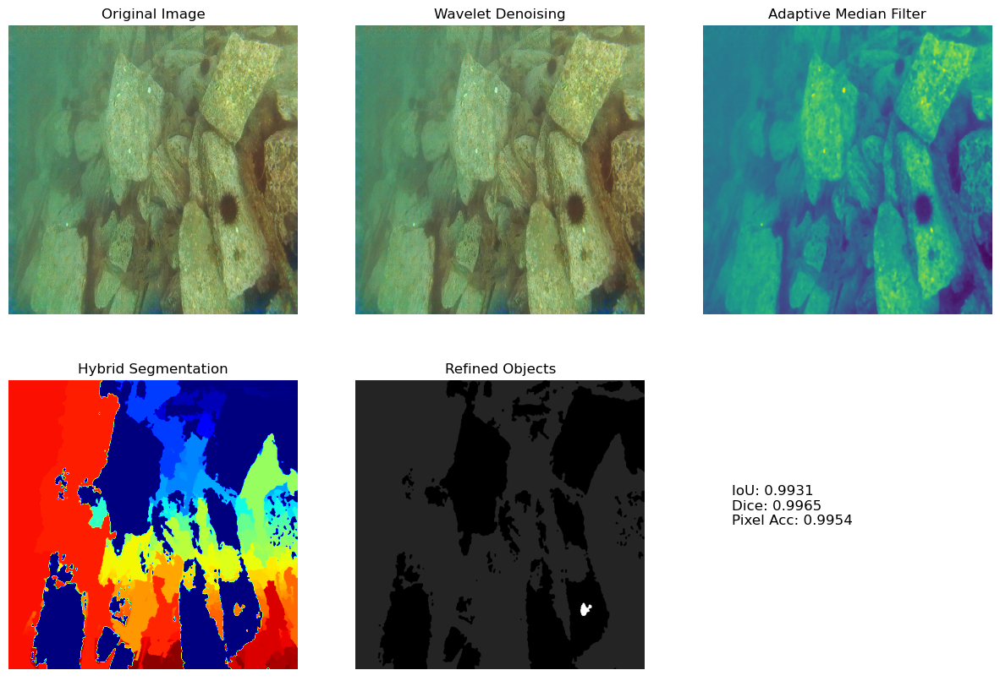

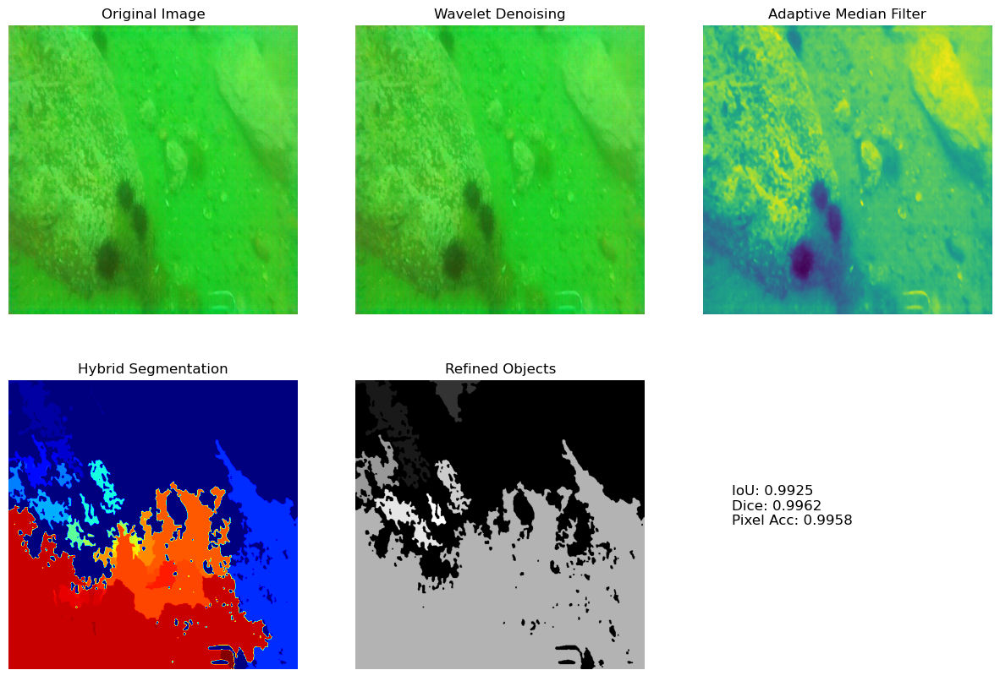

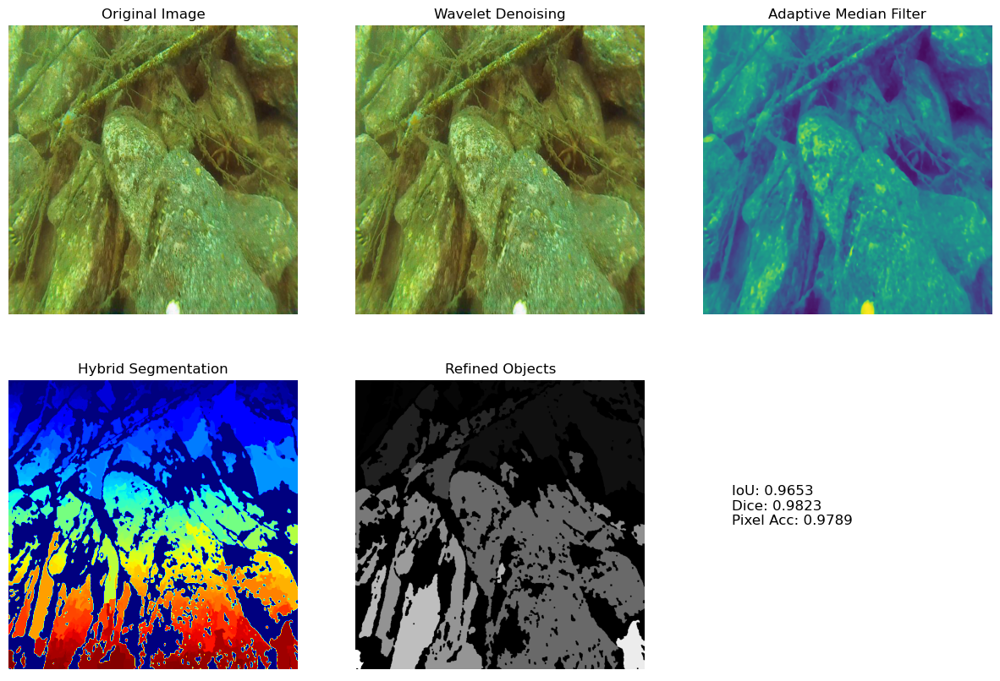

In [28]:
from datasets import load_dataset
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from skimage.segmentation import slic, mark_boundaries
from skimage.morphology import remove_small_objects, closing, square, disk
from scipy.ndimage import label
from skimage.restoration import denoise_wavelet
from skimage.filters import median
from skimage.measure import regionprops
from skimage.feature import canny
from skimage.segmentation import watershed
from skimage.color import rgb2gray
from sklearn.metrics import jaccard_score, accuracy_score, f1_score

# Load dataset
def load_data():
    dataset = load_dataset("Francesco/underwater-objects-5v7p8")
    return dataset['train']

# Advanced Noise Reduction
def apply_advanced_filters(image):
    # Wavelet Denoising (Fix: Use channel_axis=-1)
    wavelet_filtered = denoise_wavelet(image, channel_axis=-1, convert2ycbcr=True)
    # Convert to grayscale before applying the median filter
    gray_image = rgb2gray(image)
    # Adaptive Median Filtering (Fix: Use grayscale image)
    adaptive_median = median(gray_image, footprint=disk(3))
    return wavelet_filtered, adaptive_median

# Improved Segmentation (Hybrid K-Means + Watershed)
def hybrid_segmentation(image, k=3):
    # Ensure the image is grayscale
    if len(image.shape) == 3:
        img_gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        img_gray = image  # Already grayscale, use as is

    pixels = img_gray.reshape(-1, 1)
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=42).fit(pixels)
    kmeans_mask = kmeans.labels_.reshape(img_gray.shape)
    edges = canny(img_gray)
    markers = label(edges)[0]
    segmented = watershed(img_gray, markers, mask=kmeans_mask)

    return segmented


# Object Refinement using Morphological Operations
def refine_objects(segmented_image):
    labeled_array, num_features = label(segmented_image)
    refined = remove_small_objects(labeled_array, min_size=300)
    refined = closing(refined, square(3))
    return refined

# Segmentation Performance Evaluation
def evaluate_segmentation(true_mask, predicted_mask):
    true_mask_flat = (true_mask.flatten() > 0).astype(int)
    predicted_mask_flat = (predicted_mask.flatten() > 0).astype(int)
    iou = jaccard_score(true_mask_flat, predicted_mask_flat, average='binary')
    dice = f1_score(true_mask_flat, predicted_mask_flat, average='binary')
    pixel_acc = accuracy_score(true_mask_flat, predicted_mask_flat)
    return iou, dice, pixel_acc

# Process Images
def process_images():
    dataset = load_data()
    for item in dataset.select(range(3)):
        image = np.array(item['image'])

        # Apply Advanced Filters
        wavelet_filtered, adaptive_median = apply_advanced_filters(image)
        
        # Apply Hybrid Segmentation
        segmented_image = hybrid_segmentation(adaptive_median)
        
        # Refine objects
        refined = refine_objects(segmented_image)
        
        # Placeholder for ground truth (Replace with real dataset mask if available)
        true_mask = segmented_image.copy()
        
        # Evaluate segmentation
        iou, dice, pixel_acc = evaluate_segmentation(true_mask, refined)
        
        # Display Results
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        axes[0, 0].imshow(image)
        axes[0, 0].set_title("Original Image")
        axes[0, 1].imshow(wavelet_filtered)
        axes[0, 1].set_title("Wavelet Denoising")
        axes[0, 2].imshow(adaptive_median)
        axes[0, 2].set_title("Adaptive Median Filter")
        
        axes[1, 0].imshow(segmented_image, cmap='jet')
        axes[1, 0].set_title("Hybrid Segmentation")
        axes[1, 1].imshow(refined, cmap='gray')
        axes[1, 1].set_title("Refined Objects")
        axes[1, 2].text(0.1, 0.5, f'IoU: {iou:.4f}\nDice: {dice:.4f}\nPixel Acc: {pixel_acc:.4f}', fontsize=12)
        
        for ax in axes.ravel():
            ax.axis("off")
        plt.show()

if __name__ == "__main__":
    process_images()